In [14]:
# The code was removed by Watson Studio for sharing.

## The Quantitatively Optimum Houston Pub Crawl
### *Maybe...*

### **Imports:**

In [416]:
# The code was removed by Watson Studio for sharing.

In [2]:
import numpy as np
import pandas as pd
import random
import json
import requests

from sklearn.cluster import DBSCAN
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.cluster import KMeans
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import jaccard_similarity_score
from sklearn.metrics import f1_score

# mapping
import matplotlib.cm as cm
import matplotlib.colors as colors
import seaborn as sns
import matplotlib.pyplot as plt
from geopy.geocoders import Nominatim
!conda install -c conda-forge folium=0.5.0 --yes
import folium

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - folium=0.5.0


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    branca-0.3.1               |             py_0          25 KB  conda-forge
    altair-4.0.0               |             py_0         606 KB  conda-forge
    certifi-2019.11.28         |           py36_0         149 KB  conda-forge
    ca-certificates-2019.11.28 |       hecc5488_0         145 KB  conda-forge
    vincent-0.4.4              |             py_1          28 KB  conda-forge
    folium-0.5.0               |             py_0          45 KB  conda-forge
    openssl-1.1.1d             |       h516909a_0         2.1 MB  conda-forge
    ------------------------------------------------------------
                                           Total:         3.1 MB

The following NEW packages will be 

In [246]:
from pandas import DataFrame

### **Project Parameters:**

In [4]:
# Score Weighting
priorityWeight = {'Rating': 4, 'Count': 2, 'Likes': 1}


price = 2 # Scale = 1-4
distance = 0.5 # kilometer

venue = ['bar', 'pub', 'brewery', 'lounge']
FS_SECTIONS = ['drinks'] # these were singled out after several api checks
min_locations = 4
max_locations = 6

# Timing
WEEK_DAY = 6 # Saturday
startTime = 1500 # 3 PM
EndTime = 2300 # 11 PM

## **Raw Data**
### **Houston Neighborhoods:**

In [5]:
# neighborhoods
Url = 'https://opendata.arcgis.com/datasets/deae15e7f3db4b198946c17f0d169c39_3.geojson'
nJson = requests.get(Url).json()

In [6]:
# get the center coordinate from matrix
def centeroidCord(arr, multi):
    x1 = arr[0][0]
    x2 = arr[0][0]
    y1 = arr[0][1]
    y2 = arr[0][1]
    if multi:
        for cord1 in arr:
            x1 = cord1[0][0]
            x2 = cord1[0][0]
            y1 = cord1[0][1]
            y2 = cord1[0][1]
            for cord in cord1:
                x1 = min(x1, cord[0])
                x2 = max(x2, cord[0])
                y1 = min(y1, cord[1])
                y2 = max(y2, cord[1])
    else:
        for cord in arr:
            x1 = min(x1, cord[0])
            x2 = max(x2, cord[0])
            y1 = min(y1, cord[1])
            y2 = max(y2, cord[1])
    return y1 + ((y2 - y1) / 2), x1 + ((x2 - x1) / 2)

# build the neighborhood dataframe from neighborhood json (nJson) and get the approximate center coordinates
neighborhoods = []
for feature in nJson['features']:
    Lat, Long = centeroidCord(feature['geometry']['coordinates'][0], feature['geometry']['type'] != 'Polygon')
    neighborhoods.append((feature['properties']['SNBNAME'], Lat, Long, feature['properties']['Shapearea']))
    
htxNeighborhoods = pd.DataFrame(neighborhoods)
htxNeighborhoods.columns = ['Neighborhood', 'Latitude', 'Longitude', 'Area']

In [33]:
htxNeighborhoodsCleanPre = htxNeighborhoods.drop(columns=['Area'])

In [34]:
htxNeighborhoodsCleanPre.sort_values(by=['Neighborhood']).reset_index(drop=True)

,Neighborhood,Latitude,Longitude
0,ACRES HOME,29.869383,-95.439324
1,ADDICKS PARK TEN,29.820678,-95.640167
2,AFTON OAKS / RIVER OAKS AREA,29.745610,-95.434366
3,ALIEF,29.683736,-95.591389
4,ASTRODOME AREA,29.686357,-95.395823
5,BRAEBURN,29.682871,-95.517002
6,BRAESWOOD,29.691953,-95.429834
7,BRAYS OAKS,29.653857,-95.533821
8,BRIAR FOREST,29.751599,-95.572818
9,CARVERDALE,29.855192,-95.550146


In [35]:
# Save Data as CSV
project.save_data(data=htxNeighborhoodsCleanPre.to_csv(index=False),file_name='htxNeighborhoodsClean.csv',overwrite=True)

{'file_name': 'htxNeighborhoodsClean.csv',
 'message': 'File saved to project storage.',
 'bucket_name': 'capstoneproject-donotdelete-pr-dalesfhq6omorq',
 'asset_id': '728ae7f8-9cdf-4c52-9738-130b6768928e'}

In [37]:
#Getting csv file and loading as pandas datafarme

htxNeighborhoodsClean = pd.read_csv(project.get_file('htxNeighborhoodsClean.csv'))

,Neighborhood,Latitude,Longitude
0,FOURTH WARD,29.757103,-95.379773
1,SECOND WARD,29.751772,-95.326216
2,DOWNTOWN,29.755537,-95.359195
3,CLINTON PARK TRI-COMMUNITY,29.750393,-95.265858
4,GREATER UPTOWN,29.754924,-95.480595


## **Houston Map**

In [39]:
# Houston Center
geolocator = Nominatim(user_agent="my-application")
location = geolocator.geocode('Houston')
latitude = location.latitude + 0.03 # adjustment for better centering
longitude = location.longitude
print('Center coordinates of Houston are {}, {}.'.format(latitude, longitude))

Center coordinates of Houston are 29.7889382, -95.3676974.


In [40]:
def mapBuilder(center = [latitude, longitude], zoom = 11):
    localMap = folium.Map(location=center, zoom_start=zoom)

   
    localMap.choropleth(
        geo_data=nJson,
        data=htxNeighborhoods,
        columns=['Neighborhood','Area'],
        key_on='feature.properties.SNBNAME',
        fill_color='YlOrRd', 
        fill_opacity=0.3, 
        line_opacity=0.5,
        legend_name='Houston Neighborhood Perimeters'
    )
    
    return localMap

In [41]:
import math
def distFromCenter(lat, long): #Checks how far center of neighborhood is from Downtown Houston.
    cityCenterLong = -95.359195
    cityCenterLat = 29.755537
    radius = 6371 #km
    #lat = lat
    #long = long
    dlat = math.radians(cityCenterLat-lat)
    dlon = math.radians(cityCenterLong-long)
    a = math.sin(dlat/2) * math.sin(dlat/2) + math.cos(math.radians(lat)) \
        * math.cos(math.radians(cityCenterLat)) * math.sin(dlon/2) * math.sin(dlon/2)
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1-a))
    d = radius * c

    return d

In [28]:
htxNeighborhoods.iloc[0]

Neighborhood    FOURTH WARD
Latitude            29.7571
Longitude          -95.3798
Area            1.29698e+07
Name: 0, dtype: object

In [42]:
htxInnerLoop = htxNeighborhoods.copy()
htxInnerLoop['distance'] = 99999.999
print(htxNeighborhoods.head())
print(htxInnerLoop.head())

                 Neighborhood   Latitude  Longitude          Area
0                 FOURTH WARD  29.757103 -95.379773  1.296982e+07
1                 SECOND WARD  29.751772 -95.326216  8.040472e+07
2                    DOWNTOWN  29.755537 -95.359195  7.550023e+07
3  CLINTON PARK TRI-COMMUNITY  29.750393 -95.265858  7.655352e+07
4              GREATER UPTOWN  29.754924 -95.480595  2.297921e+08
                 Neighborhood   Latitude  Longitude          Area   distance
0                 FOURTH WARD  29.757103 -95.379773  1.296982e+07  99999.999
1                 SECOND WARD  29.751772 -95.326216  8.040472e+07  99999.999
2                    DOWNTOWN  29.755537 -95.359195  7.550023e+07  99999.999
3  CLINTON PARK TRI-COMMUNITY  29.750393 -95.265858  7.655352e+07  99999.999
4              GREATER UPTOWN  29.754924 -95.480595  2.297921e+08  99999.999


In [43]:
for ind in range(htxInnerLoop.shape[0]):
    htxInnerLoop['distance'][ind] = distFromCenter(htxNeighborhoods['Latitude'][ind], htxNeighborhoods['Longitude'][ind])
htxInnerLoop.head()


/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


,Neighborhood,Latitude,Longitude,Area,distance
0,FOURTH WARD,29.757103,-95.379773,1.296982e+07,1.994104
1,SECOND WARD,29.751772,-95.326216,8.040472e+07,3.211103
2,DOWNTOWN,29.755537,-95.359195,7.550023e+07,0.000055
3,CLINTON PARK TRI-COMMUNITY,29.750393,-95.265858,7.655352e+07,9.028561
4,GREATER UPTOWN,29.754924,-95.480595,2.297921e+08,11.719424


In [44]:
htxInnerLoopClean = htxInnerLoop[htxInnerLoop['distance'] < 9]
htxInnerLoopClean = htxInnerLoopClean.sort_values(by=['Neighborhood']).reset_index(drop=True)
htxInnerLoopClean

,Neighborhood,Latitude,Longitude,Area,distance
0,AFTON OAKS / RIVER OAKS AREA,29.745610,-95.434366,1.006677e+08,7.340429
1,ASTRODOME AREA,29.686357,-95.395823,8.859512e+07,8.466694
2,DENVER HARBOR / PORT HOUSTON,29.762338,-95.292673,1.781848e+08,6.465809
3,DOWNTOWN,29.755537,-95.359195,7.550023e+07,0.000055
4,FOURTH WARD,29.757103,-95.379773,1.296982e+07,1.994104
5,GREATER EASTWOOD,29.735538,-95.333214,5.227718e+07,3.352086
6,GREATER FIFTH WARD,29.775359,-95.328500,1.390635e+08,3.692737
7,GREATER HEIGHTS,29.795329,-95.404777,2.039503e+08,6.239558
8,GREATER OST / SOUTH UNION,29.695289,-95.353524,1.207881e+08,6.721581
9,GREATER THIRD WARD,29.728797,-95.354958,8.065774e+07,3.001310


In [45]:
htxNeighMap = mapBuilder()

# Mark centers of neighborhoods
for lat, lng, neighborhood in zip(htxInnerLoopClean['Latitude'], htxInnerLoopClean['Longitude'], htxInnerLoopClean['Neighborhood']):
    label = '{}'.format(neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7
    ).add_to(htxNeighMap)

In [46]:
htxNeighMap

In [47]:
def api_stacker(lat, long, neighborhood):
    LIMIT = 100 # limit of number of venues returned by Foursquare API

    radius = 500 # define radius

    # Nightlife category
    categoryID = '4d4b7105d754a06376d81259'

    # create URL
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}'.format(
        CLIENT_ID, 
        CLIENT_SECRET, 
        VERSION, 
        lat, 
        long, 
        radius, 
        LIMIT,
        categoryID)
    results = requests.get(url).json()
    if (results['response']['totalResults'] == 0):
        return 'error'
    venues = results['response']['groups'][0]['items']
    

    nearby_venues = json_normalize(venues) # flatten JSON

    # filter columns
    filtered_columns = ['venue.name', 'venue.categories', 'venue.id', 'venue.location.lat', 'venue.location.lng']
    nearby_venues =nearby_venues.loc[:, filtered_columns]

    # filter the category for each row
    nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

    # clean columns
    nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]
    nearby_venues.shape
    nearby_venues.insert(0, 'Neighborhood', neighborhood, True)
    nearby_venues.insert(1, 'NeighborhoodLatitude', lat, True)
    nearby_venues.insert(2, 'NeighborhoodLongitude', long, True)
    return nearby_venues

In [48]:
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']


In [49]:
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

In [50]:
venueList = api_stacker(htxInnerLoopClean['Latitude'][0],htxInnerLoopClean['Longitude'][0],htxInnerLoopClean['Neighborhood'][0])
vertical_stack = venueList
vertical_stack.shape



(1, 8)

In [51]:
print(htxInnerLoopClean)

                                   Neighborhood   Latitude  Longitude  \
0                  AFTON OAKS / RIVER OAKS AREA  29.745610 -95.434366   
1                                ASTRODOME AREA  29.686357 -95.395823   
2                  DENVER HARBOR / PORT HOUSTON  29.762338 -95.292673   
3                                      DOWNTOWN  29.755537 -95.359195   
4                                   FOURTH WARD  29.757103 -95.379773   
5                              GREATER EASTWOOD  29.735538 -95.333214   
6                            GREATER FIFTH WARD  29.775359 -95.328500   
7                               GREATER HEIGHTS  29.795329 -95.404777   
8                     GREATER OST / SOUTH UNION  29.695289 -95.353524   
9                            GREATER THIRD WARD  29.728797 -95.354958   
10                  GREENWAY / UPPER KIRBY AREA  29.731443 -95.435452   
11             GULFGATE RIVERVIEW / PINE VALLEY  29.710230 -95.314098   
12                         INDEPENDENCE HEIGHTS  29

In [52]:
emptyCount = 0
for ind in range(1,htxInnerLoopClean.shape[0]):
    venueList = api_stacker(htxInnerLoopClean['Latitude'][ind],htxInnerLoopClean['Longitude'][ind],htxInnerLoopClean['Neighborhood'][ind])
    if (type(venueList) == str):
        emptyCount += 1
        continue
    vertical_stack = pd.concat([vertical_stack, venueList], axis=0)
print(emptyCount, ' neighborhoods without a venue in range of center')

8  neighborhoods without a venue in range of center


In [53]:
print(vertical_stack.shape)
vertical_stack.head()

(130, 8)


,Neighborhood,NeighborhoodLatitude,NeighborhoodLongitude,name,categories,id,lat,lng
0,AFTON OAKS / RIVER OAKS AREA,29.745610,-95.434366,LAREDO HUNT CLUB,Sports Bar,5407f927498e112bd69c0469,29.746623,-95.437094
0,ASTRODOME AREA,29.686357,-95.395823,Island Sizzler - Jamaican Rum Bar & Grill,Caribbean Restaurant,524a02537e4851b12ec68fdf,29.685125,-95.399337
1,ASTRODOME AREA,29.686357,-95.395823,Texas Hookah Lounge,Hookah Bar,50a3c362b0ed5afb2948ce8a,29.684530,-95.391439
2,ASTRODOME AREA,29.686357,-95.395823,Coaches Corner Sports Bar,Sports Bar,5369449011d2b29ff9daaf9e,29.688154,-95.391081
3,ASTRODOME AREA,29.686357,-95.395823,Club Rage Bar,Bar,513ca595e4b010988dfa2485,29.687973,-95.396573


In [54]:
# Save Data as CSV
project.save_data(data=vertical_stack.to_csv(index=False),file_name='vertical_stack.csv',overwrite=True)

{'file_name': 'vertical_stack.csv',
 'message': 'File saved to project storage.',
 'bucket_name': 'capstoneproject-donotdelete-pr-dalesfhq6omorq',
 'asset_id': 'fb2d070f-9d1b-4afd-9884-32dba5afacfa'}

In [57]:
#Getting csv file and loading as pandas datafarme

vertical_stack = pd.read_csv(project.get_file('vertical_stack.csv'))

In [59]:
# there should be quite a few duplicates
htxVenues = vertical_stack.drop_duplicates(subset=['id'])
print(htxVenues.shape)

# unique categories
htxVenues['categories'].unique().tolist()

(129, 8)


['Sports Bar',
 'Caribbean Restaurant',
 'Hookah Bar',
 'Bar',
 'Pub',
 'Beach Bar',
 'Italian Restaurant',
 'Hotel',
 'Gastropub',
 'New American Restaurant',
 'Lounge',
 'Whisky Bar',
 'Hotel Bar',
 'Roof Deck',
 'Portuguese Restaurant',
 'Gay Bar',
 'Nightclub',
 'Dive Bar',
 'Cocktail Bar',
 'Speakeasy',
 'Café',
 'Night Market',
 'Wine Bar',
 'Tapas Restaurant',
 'Boutique',
 'American Restaurant',
 'Vietnamese Restaurant',
 'Beer Garden',
 'Spanish Restaurant',
 'Karaoke Bar',
 'Seafood Restaurant',
 'Asian Restaurant',
 'Southern / Soul Food Restaurant',
 'Coffee Shop',
 'Mexican Restaurant',
 'Mediterranean Restaurant',
 'Pool Hall',
 'Dance Studio']

In [60]:
VENUE_KEYS = htxVenues['categories'].unique()

In [61]:
# remove gay bars
htxVenues = htxVenues[htxVenues.categories != 'Gay Bar']

print(htxVenues.shape)
htxVenues['categories'].unique().tolist()

(128, 8)


['Sports Bar',
 'Caribbean Restaurant',
 'Hookah Bar',
 'Bar',
 'Pub',
 'Beach Bar',
 'Italian Restaurant',
 'Hotel',
 'Gastropub',
 'New American Restaurant',
 'Lounge',
 'Whisky Bar',
 'Hotel Bar',
 'Roof Deck',
 'Portuguese Restaurant',
 'Nightclub',
 'Dive Bar',
 'Cocktail Bar',
 'Speakeasy',
 'Café',
 'Night Market',
 'Wine Bar',
 'Tapas Restaurant',
 'Boutique',
 'American Restaurant',
 'Vietnamese Restaurant',
 'Beer Garden',
 'Spanish Restaurant',
 'Karaoke Bar',
 'Seafood Restaurant',
 'Asian Restaurant',
 'Southern / Soul Food Restaurant',
 'Coffee Shop',
 'Mexican Restaurant',
 'Mediterranean Restaurant',
 'Pool Hall',
 'Dance Studio']

In [62]:
htxVenues.head()

,Neighborhood,NeighborhoodLatitude,NeighborhoodLongitude,name,categories,id,lat,lng
0,AFTON OAKS / RIVER OAKS AREA,29.745610,-95.434366,LAREDO HUNT CLUB,Sports Bar,5407f927498e112bd69c0469,29.746623,-95.437094
1,ASTRODOME AREA,29.686357,-95.395823,Island Sizzler - Jamaican Rum Bar & Grill,Caribbean Restaurant,524a02537e4851b12ec68fdf,29.685125,-95.399337
2,ASTRODOME AREA,29.686357,-95.395823,Texas Hookah Lounge,Hookah Bar,50a3c362b0ed5afb2948ce8a,29.684530,-95.391439
3,ASTRODOME AREA,29.686357,-95.395823,Coaches Corner Sports Bar,Sports Bar,5369449011d2b29ff9daaf9e,29.688154,-95.391081
4,ASTRODOME AREA,29.686357,-95.395823,Club Rage Bar,Bar,513ca595e4b010988dfa2485,29.687973,-95.396573


In [63]:
venueMap = mapBuilder()

# add approximate buisness center markers to map
for lat, lng, venue in zip(htxVenues['lat'], htxVenues['lng'], htxVenues['name']):
    label = '{}'.format(venue)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='black',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7
        ).add_to(venueMap)
    
# display map
venueMap

In [64]:
coords = htxVenues[['lat', 'lng']].to_numpy()

kmsPerRadian = 6371.0088
epsilon = distance / kmsPerRadian # in km radians

cvDb = DBSCAN(eps=epsilon, min_samples=min_locations, algorithm='ball_tree', metric='haversine').fit(np.radians(coords))
clusterLabels = cvDb.labels_
numClusters = len(set(clusterLabels))
clusters = pd.Series([coords[clusterLabels == n] for n in range(numClusters)])
print('Number of clusters: {}'.format(numClusters))
set(clusterLabels)

Number of clusters: 9


{-1, 0, 1, 2, 3, 4, 5, 6, 7}

In [65]:
htxVenues['DbCluster'] = clusterLabels
htxVenues.head(10)
htxVenues.dtypes

Neighborhood              object
NeighborhoodLatitude     float64
NeighborhoodLongitude    float64
name                      object
categories                object
id                        object
lat                      float64
lng                      float64
DbCluster                  int64
dtype: object

In [66]:
clusterMap = mapBuilder()
colors = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)]) for i in range(numClusters)]


# add venues with cluster colors


# display map
clusterMap


In [67]:
for lat, lng, venue, clustN in zip(htxVenues['lat'], htxVenues['lng'], htxVenues['name'], htxVenues['DbCluster']):
    label = '{}'.format(venue)
    label = folium.Popup(label, parse_html=True)
    
    # red around blue for outliers otherwise random colors
    c=('blue' if clustN == -1 else colors[np.int(clustN)])
    fc=('red' if clustN == -1 else colors[np.int(clustN)])
    folium.CircleMarker(
        [lat, lng],
        radius=1,
        popup=label,
        color='red',
        fill=True,
        fill_color='blue',
        fill_opacity=0.7).add_to(clusterMap)

In [68]:
type(clusterMap)

folium.folium.Map

In [69]:
display(clusterMap)

In [70]:
# remove outliers
htxVenues = htxVenues[htxVenues.DbCluster != -1].reset_index(drop=True)

print('We are now have {}'.format(htxVenues.shape[0])+' venues, and {}'.format(numClusters -1)+(' neighborhoods to pick from.'))

We are now have 93 venues, and 8 neighborhoods to pick from.


In [71]:
# Pull Venue details
vDetails = []
i = 0
for vId, cluster in zip(htxVenues['id'], htxVenues['DbCluster']):
    url = "https://api.foursquare.com/v2/venues/{}?client_id={}&client_secret={}&v={}".format( vId, CLIENT_ID, CLIENT_SECRET, VERSION)
    result = requests.get(url).json()
    try:
        result = result['response']['venue'] 
    except: 
        print(i) 
        print(vId) 
        print(result) 
        break 
    i = i+1 
    price = None 
    rating = None 
    likes = None 
    try: 
        price = result['price']['tier'] 
    except: 
            pass 
    try: 
        rating = result['rating'] 
    except: 
        pass 
    try: 
        likes = result['likes']['count'] 
    except: 
        pass 
    vDetails.append(( cluster, rating, likes, price ))
    len(vDetails)

50
55693c82498e40bf31c24d32
{'meta': {'code': 429, 'errorType': 'quota_exceeded', 'errorDetail': 'Quota exceeded', 'requestId': '5e1ccc471d67cb001b992e34'}, 'response': {}}


In [156]:
htxVenuesID2 = []
for x in range(50,htxVenues['id'].shape[0]):
    htxVenuesID2.append(htxVenues['id'][x])
len(htxVenuesID2)

43

In [157]:
htxVenuesCluster2 = []
for x in range(50,htxVenues['DbCluster'].shape[0]):
    htxVenuesCluster2.append(htxVenues['DbCluster'][x])
len(htxVenuesCluster2)

43

In [158]:
# 2nd Pull 
vDetails2 = []
i = 0
for vId, cluster in zip(htxVenuesID2, htxVenuesCluster2):
    url = "https://api.foursquare.com/v2/venues/{}?client_id={}&client_secret={}&v={}".format( vId, CLIENT_ID2, CLIENT_SECRET2, VERSION)
    result = requests.get(url).json()
    try:
        result = result['response']['venue'] 
    except: 
        print(i) 
        print(vId) 
        print(result) 
        break 
    i = i+1 
    price = None 
    rating = None 
    likes = None 
    try: 
        price = result['price']['tier'] 
    except: 
            pass 
    try: 
        rating = result['rating'] 
    except: 
        pass 
    try: 
        likes = result['likes']['count'] 
    except: 
        pass 
    vDetails2.append(( cluster, rating, likes, price ))
    len(vDetails2)

In [72]:
venueDetails = pd.DataFrame(vDetails) # define the column names
venueDetails.columns = ['DbCluster', 'Rating', 'Likes', 'Price']

In [159]:
venueDetails2 = pd.DataFrame(vDetails2) # define the column names
venueDetails2.columns = ['DbCluster', 'Rating', 'Likes', 'Price']

In [73]:
print(venueDetails.shape)
venueDetails.head(10)

(50, 4)


,DbCluster,Rating,Likes,Price
0,0,7.7,32,1.0
1,0,7.0,16,1.0
2,0,6.7,9,1.0
3,0,NaN,0,2.0
4,0,NaN,0,1.0
5,0,NaN,0,NaN
6,0,NaN,1,1.0
7,1,8.2,60,1.0
8,1,8.2,37,2.0
9,1,8.6,125,NaN


In [160]:
print(venueDetails2.shape)
venueDetails2.head(10)

(43, 4)


,DbCluster,Rating,Likes,Price
0,5,8.2,89,3.0
1,5,8.3,65,3.0
2,5,8.0,31,2.0
3,5,7.1,27,2.0
4,5,7.3,48,2.0
5,5,7.4,88,1.0
6,5,7.7,45,4.0
7,5,6.9,51,2.0
8,5,7.1,6,2.0
9,5,6.6,103,2.0


In [74]:
# Save Data as CSV
project.save_data(data=venueDetails.to_csv(index=False),file_name='venueDetails.csv',overwrite=True)

{'file_name': 'venueDetails.csv',
 'message': 'File saved to project storage.',
 'bucket_name': 'capstoneproject-donotdelete-pr-dalesfhq6omorq',
 'asset_id': '07610ec0-07e9-4f34-849a-2f37400c0f71'}

In [161]:
# Save Data as CSV
project.save_data(data=venueDetails2.to_csv(index=False),file_name='venueDetails2.csv',overwrite=True)

{'file_name': 'venueDetails2.csv',
 'message': 'File saved to project storage.',
 'bucket_name': 'capstoneproject-donotdelete-pr-dalesfhq6omorq',
 'asset_id': 'b76e9189-023d-4830-a70a-f268061eb521'}

In [119]:
#Getting csv file and loading as pandas datafarme

venueDetails = pd.read_csv(project.get_file('venueDetails.csv'))

In [162]:
#Getting csv file and loading as pandas datafarme

venueDetails2 = pd.read_csv(project.get_file('venueDetails2.csv'))

In [167]:
venueDetails.shape

(50, 4)

In [166]:
venueDetails2.shape

(43, 4)

In [169]:
venueDetails3 = []
venueDetails3 = pd.concat([venueDetails,venueDetails2])
venueDetails3

,DbCluster,Rating,Likes,Price
0,0,7.7,32,1.0
1,0,7.0,16,1.0
2,0,6.7,9,1.0
3,0,NaN,0,2.0
4,0,NaN,0,1.0
5,0,NaN,0,NaN
6,0,NaN,1,1.0
7,1,8.2,60,1.0
8,1,8.2,37,2.0
9,1,8.6,125,NaN


In [120]:
htxVenuesID = htxVenues['categories'].unique().copy()
htxVenuesID2 = [x.lower() for x in htxVenuesID]
htxVenuesIDdf = pd.DataFrame({'categories':htxVenuesID2})
htxVenuesIDdf

,categories
0,caribbean restaurant
1,hookah bar
2,sports bar
3,bar
4,pub
5,beach bar
6,italian restaurant
7,hotel
8,gastropub
9,new american restaurant


In [170]:
# loop through venues to build new df for modeling
vPrice = [] # df for later
vPriceFeats = [] # df of categories and cluster
vPriceComplete = [] # for plotting
vPriceLabels = [] # closed, partial (parially open), and open



#htxVenues
for i, row in venueDetails3.iterrows():
    vId = htxVenues.loc[i, 'id']
    cVrow = htxVenues.loc[htxVenues['id'] == vId]
    vPriceComplete.append((vId, row['Rating'], row['Likes'], row['Price']))
    if pd.isna(row['Price']):
        continue
    vCatName = htxVenues.loc[i, 'categories']
    catName = vCatName.lower()
    vCat = -1
    for ind in range(htxVenuesIDdf.shape[0]):
        #print(catName, "---", htxVenuesIDdf['categories'][ind])
        if htxVenuesIDdf['categories'][ind] == catName:
            vCat = ind
            break
    #print('Match:',ind, '---',vCat)
    vPriceFeats.append((int(row['DbCluster']), vCat,  float(row['Rating']), int(row['Likes'])))
    vPrice.append((vId, int(row['Price'])))
    vPriceLabels.append(int(row['Price']))

vPrice = pd.DataFrame(vPrice)
vPrice.columns = ['VenueId', 'VenuePrice']

vPriceFeats = pd.DataFrame(vPriceFeats)
vPriceFeats.columns = ['DbCluster', 'VenueCategory', 'VenueRating', 'VenueLikes']

vPriceComplete = pd.DataFrame(vPriceComplete)
vPriceComplete.columns = ['id', 'VenueRating', 'VenueLikes', 'VenuePrice']

print(vPriceFeats.shape)
vPriceFeats

(87, 4)


,DbCluster,VenueCategory,VenueRating,VenueLikes
0,0,0,7.7,32
1,0,1,7.0,16
2,0,2,6.7,9
3,0,3,NaN,0
4,0,4,NaN,0
5,0,1,NaN,1
6,1,2,8.2,60
7,1,6,8.2,37
8,1,8,7.8,138
9,1,9,8.3,184


In [277]:
vPriceFeats.sort_values('DbCluster')

,DbCluster,VenueCategory,VenueRating,VenueLikes,VenuePrice
0,0,0,7.7,32,1
1,0,1,7.0,16,1
2,0,2,6.7,9,1
3,0,3,NaN,0,2
4,0,4,NaN,0,1
5,0,1,NaN,1,1
21,1,3,NaN,1,2
20,1,3,NaN,4,2
19,1,2,6.2,6,1
18,1,3,7.1,74,2


In [278]:
vPriceFeats.head()

,DbCluster,VenueCategory,VenueRating,VenueLikes,VenuePrice
0,0,0,7.7,32,1
1,0,1,7.0,16,1
2,0,2,6.7,9,1
3,0,3,NaN,0,2
4,0,4,NaN,0,1


In [172]:
vPriceCorr = vPriceFeats
vPriceCorr['VenuePrice'] = vPriceLabels
vPriceCorr.corr()

,DbCluster,VenueCategory,VenueRating,VenueLikes,VenuePrice
DbCluster,1.000000,0.294767,0.042296,0.170855,0.128310
VenueCategory,0.294767,1.000000,0.309386,0.108539,0.163650
VenueRating,0.042296,0.309386,1.000000,0.481140,0.063573
VenueLikes,0.170855,0.108539,0.481140,1.000000,-0.080544
VenuePrice,0.128310,0.163650,0.063573,-0.080544,1.000000


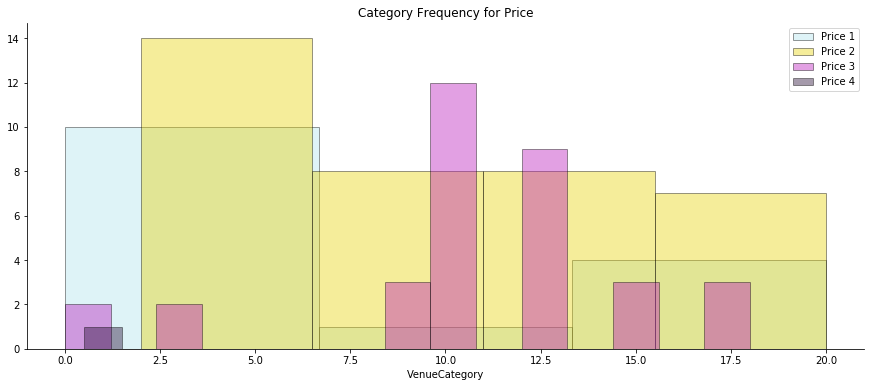

In [403]:
plt.figure(figsize=(15,6))
plt.title("Category Frequency for Price")
priceIndex = [1,2,3,4]
colors = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)]) for i in priceIndex]

for i in priceIndex:
    sns.distplot(vPriceCorr[vPriceCorr.VenuePrice == i].VenueCategory, color=colors[i-1], kde=False, label='Price {}'.format(i),
                hist_kws={'edgecolor':'black'})

#plt.xticks(range(len(VENUE_KEYS)), VENUE_KEYS,rotation='vertical', fontsize=10)

plt.legend()
plt.gca().spines['right'].set_color('none')
plt.gca().spines['top'].set_color('none')
plt.show()

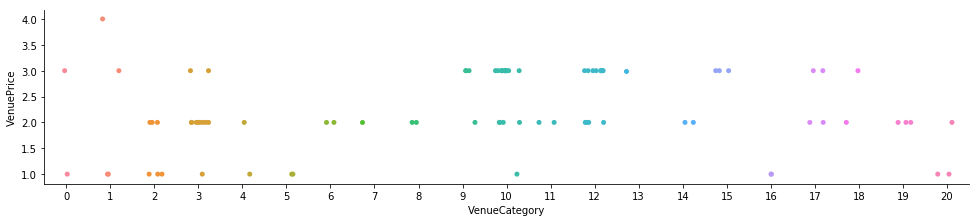

In [388]:
catP = sns.catplot(x='VenueCategory', y='VenuePrice', 
            data=vPriceCorr,
            jitter='0.3',
            height=4, aspect=1.5)

catP.fig.set_size_inches(15,3)
#plt.xticks(range(len(VENUE_KEYS)), VENUE_KEYS,rotation='vertical', fontsize=10)
plt.show()

In [405]:
Xp = vPriceFeats.drop(columns=['VenueRating', 'VenueLikes', 'VenuePrice']) 
Yp = vPriceLabels

Xp_train, Xp_test, Yp_train, Yp_test = train_test_split( Xp, Yp, test_size=0.35, random_state=0)
scaler = preprocessing.StandardScaler().fit(Xp_train)
Xp_train_transformed = scaler.transform(Xp_train)
print ('Train set:', len(Xp_train),  len(Yp_train))
print ('Test set:', len(Xp_test),  len(Yp_test))

u, count = np.unique(Yp, return_counts=True)
print(u, count/len(Yp))
uTest, countTest = np.unique(Yp_test, return_counts=True)
print(uTest, countTest/len(Yp_test))

Train set: 56 56
Test set: 31 31
[1 2 3 4] [0.17241379 0.42528736 0.3908046  0.01149425]
[1 2 3] [0.19354839 0.58064516 0.22580645]


/opt/conda/envs/Python36/lib/python3.6/site-packages/sklearn/preprocessing/data.py:645: DataConversionWarning: Data with input dtype int64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:6: DataConversionWarning: Data with input dtype int64 were all converted to float64 by StandardScaler.


In [406]:
Ks = 10
mean_acc = np.zeros((Ks-1))
for n in range(1,Ks):
    neigh = KNeighborsClassifier(n_neighbors = n).fit(Xp_train_transformed,Yp_train)
    yhat=neigh.predict(Xp_test)
    mean_acc[n-1] = metrics.accuracy_score(Yp_test, yhat)

priceKNN = KNeighborsClassifier(n_neighbors = mean_acc.argmax()+1).fit(Xp_train_transformed,Yp_train)
yhat = priceKNN.predict(Xp_test)
print( "The best KNN's accuracy was with accuracy of", mean_acc.max(), "with k=", mean_acc.argmax()+1) 
print("Jaccard Score: ", jaccard_similarity_score(Yp_test, yhat))
print("F1 Score: ", f1_score(Yp_test, yhat, average='weighted'))

The best KNN's accuracy was with accuracy of 0.5806451612903226 with k= 1
Jaccard Score:  0.5806451612903226
F1 Score:  0.4265964450296248


/opt/conda/envs/Python36/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [407]:
priceLR = LogisticRegression(solver='liblinear').fit(Xp_train_transformed,Yp_train)
yhatLR = priceLR.predict(Xp_test)
metrics.accuracy_score(Yp_test, yhatLR)
print("Jaccard Score: ", jaccard_similarity_score(Yp_test, yhatLR))
print("F1 Score: ", f1_score(Yp_test, yhatLR, average='weighted'))

Jaccard Score:  0.2903225806451613
F1 Score:  0.2335840877215351


/opt/conda/envs/Python36/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/opt/conda/envs/Python36/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [296]:
venuesP = pd.merge(htxVenues, vPriceComplete, on=['id'], how='outer')
print(venuesP.shape)
venuesP

(136, 12)


,Neighborhood,NeighborhoodLatitude,NeighborhoodLongitude,name,categories,id,lat,lng,DbCluster,VenueRating,VenueLikes,VenuePrice
0,ASTRODOME AREA,29.686357,-95.395823,Island Sizzler - Jamaican Rum Bar & Grill,Caribbean Restaurant,524a02537e4851b12ec68fdf,29.685125,-95.399337,0,7.7,32.0,1.0
1,ASTRODOME AREA,29.686357,-95.395823,Island Sizzler - Jamaican Rum Bar & Grill,Caribbean Restaurant,524a02537e4851b12ec68fdf,29.685125,-95.399337,0,8.2,89.0,3.0
2,ASTRODOME AREA,29.686357,-95.395823,Texas Hookah Lounge,Hookah Bar,50a3c362b0ed5afb2948ce8a,29.684530,-95.391439,0,7.0,16.0,1.0
3,ASTRODOME AREA,29.686357,-95.395823,Texas Hookah Lounge,Hookah Bar,50a3c362b0ed5afb2948ce8a,29.684530,-95.391439,0,8.3,65.0,3.0
4,ASTRODOME AREA,29.686357,-95.395823,Coaches Corner Sports Bar,Sports Bar,5369449011d2b29ff9daaf9e,29.688154,-95.391081,0,6.7,9.0,1.0
5,ASTRODOME AREA,29.686357,-95.395823,Coaches Corner Sports Bar,Sports Bar,5369449011d2b29ff9daaf9e,29.688154,-95.391081,0,8.0,31.0,2.0
6,ASTRODOME AREA,29.686357,-95.395823,Club Rage Bar,Bar,513ca595e4b010988dfa2485,29.687973,-95.396573,0,NaN,0.0,2.0
7,ASTRODOME AREA,29.686357,-95.395823,Club Rage Bar,Bar,513ca595e4b010988dfa2485,29.687973,-95.396573,0,7.1,27.0,2.0
8,ASTRODOME AREA,29.686357,-95.395823,Skyrim,Pub,4fbeae91e4b0906902153250,29.687964,-95.394464,0,NaN,0.0,1.0
9,ASTRODOME AREA,29.686357,-95.395823,Skyrim,Pub,4fbeae91e4b0906902153250,29.687964,-95.394464,0,7.3,48.0,2.0


In [297]:
venuesP.sort_values('DbCluster')

,Neighborhood,NeighborhoodLatitude,NeighborhoodLongitude,name,categories,id,lat,lng,DbCluster,VenueRating,VenueLikes,VenuePrice
0,ASTRODOME AREA,29.686357,-95.395823,Island Sizzler - Jamaican Rum Bar & Grill,Caribbean Restaurant,524a02537e4851b12ec68fdf,29.685125,-95.399337,0,7.7,32.0,1.0
13,ASTRODOME AREA,29.686357,-95.395823,Mom & Pop Smoke Shop,Hookah Bar,51fed060498e17b70060c7f1,29.684810,-95.399099,0,7.7,45.0,4.0
12,ASTRODOME AREA,29.686357,-95.395823,Mom & Pop Smoke Shop,Hookah Bar,51fed060498e17b70060c7f1,29.684810,-95.399099,0,NaN,1.0,1.0
11,ASTRODOME AREA,29.686357,-95.395823,The Adams Apple,Beach Bar,53a24861498e842fac03ffb2,29.687251,-95.393584,0,7.4,88.0,1.0
9,ASTRODOME AREA,29.686357,-95.395823,Skyrim,Pub,4fbeae91e4b0906902153250,29.687964,-95.394464,0,7.3,48.0,2.0
8,ASTRODOME AREA,29.686357,-95.395823,Skyrim,Pub,4fbeae91e4b0906902153250,29.687964,-95.394464,0,NaN,0.0,1.0
7,ASTRODOME AREA,29.686357,-95.395823,Club Rage Bar,Bar,513ca595e4b010988dfa2485,29.687973,-95.396573,0,7.1,27.0,2.0
10,ASTRODOME AREA,29.686357,-95.395823,The Adams Apple,Beach Bar,53a24861498e842fac03ffb2,29.687251,-95.393584,0,NaN,0.0,NaN
5,ASTRODOME AREA,29.686357,-95.395823,Coaches Corner Sports Bar,Sports Bar,5369449011d2b29ff9daaf9e,29.688154,-95.391081,0,8.0,31.0,2.0
4,ASTRODOME AREA,29.686357,-95.395823,Coaches Corner Sports Bar,Sports Bar,5369449011d2b29ff9daaf9e,29.688154,-95.391081,0,6.7,9.0,1.0


In [298]:
# create a predicted value df
venuesP = pd.merge(htxVenues, vPriceComplete, on=['id'], how='outer')
pId = []
pNorm = []
for i, row in venuesP.iterrows():
    if pd.isna(row['VenuePrice']):
        pId.append(row['id'])
        vCat = row['categories']
        catName = vCat.lower()
        vCat = -1
        for ind in range(htxVenuesIDdf.shape[0]):
            #print(catName, "---", htxVenuesIDdf['categories'][ind])
            if htxVenuesIDdf['categories'][ind] == catName:
                vCat = ind
                break
        vCluster = cVrow['DbCluster']
        pNorm.append((vCat, vCluster))

pX = preprocessing.StandardScaler().fit(pNorm).transform(pNorm)      
pYhat = priceKNN.predict(pX)
newPrice = pd.DataFrame(np.stack((pId, pYhat), axis=-1))
newPrice.columns = ['id', 'VenuePrice']
newPrice['VenuePrice'] = newPrice['VenuePrice'].astype('int32')
print(venuesP['VenuePrice'].unique().tolist())
print(newPrice['VenuePrice'].unique().tolist())
for i, row in newPrice.iterrows():
    venuesP.loc[venuesP['id'] == row['id'], 'VenuePrice'] = row['VenuePrice']
venuesP['VenuePrice'].unique().tolist()

[1.0, 3.0, 2.0, nan, 4.0]
[3]


[1.0, 3.0, 2.0, 4.0]

In [306]:
print(venuesP.shape)
venuesP = venuesP[venuesP.VenuePrice <= price]
print(venuesP.shape)

# then drop the column
htxVenues2 = venuesP
htxVenues2

(48, 12)
(48, 12)


,Neighborhood,NeighborhoodLatitude,NeighborhoodLongitude,name,categories,id,lat,lng,DbCluster,VenueRating,VenueLikes,VenuePrice
0,ASTRODOME AREA,29.686357,-95.395823,Island Sizzler - Jamaican Rum Bar & Grill,Caribbean Restaurant,524a02537e4851b12ec68fdf,29.685125,-95.399337,0,7.7,32.0,1.0
2,ASTRODOME AREA,29.686357,-95.395823,Texas Hookah Lounge,Hookah Bar,50a3c362b0ed5afb2948ce8a,29.684530,-95.391439,0,7.0,16.0,1.0
4,ASTRODOME AREA,29.686357,-95.395823,Coaches Corner Sports Bar,Sports Bar,5369449011d2b29ff9daaf9e,29.688154,-95.391081,0,6.7,9.0,1.0
5,ASTRODOME AREA,29.686357,-95.395823,Coaches Corner Sports Bar,Sports Bar,5369449011d2b29ff9daaf9e,29.688154,-95.391081,0,8.0,31.0,2.0
6,ASTRODOME AREA,29.686357,-95.395823,Club Rage Bar,Bar,513ca595e4b010988dfa2485,29.687973,-95.396573,0,NaN,0.0,2.0
7,ASTRODOME AREA,29.686357,-95.395823,Club Rage Bar,Bar,513ca595e4b010988dfa2485,29.687973,-95.396573,0,7.1,27.0,2.0
8,ASTRODOME AREA,29.686357,-95.395823,Skyrim,Pub,4fbeae91e4b0906902153250,29.687964,-95.394464,0,NaN,0.0,1.0
9,ASTRODOME AREA,29.686357,-95.395823,Skyrim,Pub,4fbeae91e4b0906902153250,29.687964,-95.394464,0,7.3,48.0,2.0
12,ASTRODOME AREA,29.686357,-95.395823,Mom & Pop Smoke Shop,Hookah Bar,51fed060498e17b70060c7f1,29.684810,-95.399099,0,NaN,1.0,1.0
14,DOWNTOWN,29.755537,-95.359195,Biggio's,Sports Bar,5814b48d38fa91a230b3085d,29.754688,-95.358142,1,8.2,60.0,1.0


In [307]:
htxVenues2 = htxVenues2[htxVenues2['DbCluster'] != -1]

In [308]:
htxCrawlVenues = htxVenues2
dBs = htxCrawlVenues['DbCluster'].unique().tolist()
keyArray = []

dBs = htxCrawlVenues['DbCluster'].unique().tolist()
print('We are now down to {}'.format(htxCrawlVenues.shape[0])+' venues! And {}'.format(len(dBs))+(' neighborhood sections to pick from.'))

We are now down to 47 venues! And 4 neighborhood sections to pick from.


In [309]:
# recluster
# pull venue coordinates into a matrix
coords = htxCrawlVenues[['lat', 'lng']].to_numpy()

cvDb = DBSCAN(eps=epsilon, min_samples=min_locations, algorithm='ball_tree', metric='haversine').fit(np.radians(coords))
clusterLabels = cvDb.labels_
numClusters = len(set(clusterLabels))
clusters = pd.Series([coords[clusterLabels == n] for n in range(numClusters)])
print('Number of clusters: {}'.format(numClusters))
set(clusterLabels)

# combine the cluster data with htxVenues
htxCrawlVenues.drop(columns=['DbCluster'])
htxCrawlVenues['DbCluster'] = clusterLabels
htxCrawlVenues.head(10)

Number of clusters: 4


/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


,Neighborhood,NeighborhoodLatitude,NeighborhoodLongitude,name,categories,id,lat,lng,DbCluster,VenueRating,VenueLikes,VenuePrice
0,ASTRODOME AREA,29.686357,-95.395823,Island Sizzler - Jamaican Rum Bar & Grill,Caribbean Restaurant,524a02537e4851b12ec68fdf,29.685125,-95.399337,0,7.7,32.0,1.0
2,ASTRODOME AREA,29.686357,-95.395823,Texas Hookah Lounge,Hookah Bar,50a3c362b0ed5afb2948ce8a,29.684530,-95.391439,0,7.0,16.0,1.0
4,ASTRODOME AREA,29.686357,-95.395823,Coaches Corner Sports Bar,Sports Bar,5369449011d2b29ff9daaf9e,29.688154,-95.391081,0,6.7,9.0,1.0
5,ASTRODOME AREA,29.686357,-95.395823,Coaches Corner Sports Bar,Sports Bar,5369449011d2b29ff9daaf9e,29.688154,-95.391081,0,8.0,31.0,2.0
6,ASTRODOME AREA,29.686357,-95.395823,Club Rage Bar,Bar,513ca595e4b010988dfa2485,29.687973,-95.396573,0,NaN,0.0,2.0
7,ASTRODOME AREA,29.686357,-95.395823,Club Rage Bar,Bar,513ca595e4b010988dfa2485,29.687973,-95.396573,0,7.1,27.0,2.0
8,ASTRODOME AREA,29.686357,-95.395823,Skyrim,Pub,4fbeae91e4b0906902153250,29.687964,-95.394464,0,NaN,0.0,1.0
9,ASTRODOME AREA,29.686357,-95.395823,Skyrim,Pub,4fbeae91e4b0906902153250,29.687964,-95.394464,0,7.3,48.0,2.0
12,ASTRODOME AREA,29.686357,-95.395823,Mom & Pop Smoke Shop,Hookah Bar,51fed060498e17b70060c7f1,29.684810,-95.399099,0,NaN,1.0,1.0
14,DOWNTOWN,29.755537,-95.359195,Biggio's,Sports Bar,5814b48d38fa91a230b3085d,29.754688,-95.358142,1,8.2,60.0,1.0


In [310]:
htxCrawlVenues

,Neighborhood,NeighborhoodLatitude,NeighborhoodLongitude,name,categories,id,lat,lng,DbCluster,VenueRating,VenueLikes,VenuePrice
0,ASTRODOME AREA,29.686357,-95.395823,Island Sizzler - Jamaican Rum Bar & Grill,Caribbean Restaurant,524a02537e4851b12ec68fdf,29.685125,-95.399337,0,7.7,32.0,1.0
2,ASTRODOME AREA,29.686357,-95.395823,Texas Hookah Lounge,Hookah Bar,50a3c362b0ed5afb2948ce8a,29.684530,-95.391439,0,7.0,16.0,1.0
4,ASTRODOME AREA,29.686357,-95.395823,Coaches Corner Sports Bar,Sports Bar,5369449011d2b29ff9daaf9e,29.688154,-95.391081,0,6.7,9.0,1.0
5,ASTRODOME AREA,29.686357,-95.395823,Coaches Corner Sports Bar,Sports Bar,5369449011d2b29ff9daaf9e,29.688154,-95.391081,0,8.0,31.0,2.0
6,ASTRODOME AREA,29.686357,-95.395823,Club Rage Bar,Bar,513ca595e4b010988dfa2485,29.687973,-95.396573,0,NaN,0.0,2.0
7,ASTRODOME AREA,29.686357,-95.395823,Club Rage Bar,Bar,513ca595e4b010988dfa2485,29.687973,-95.396573,0,7.1,27.0,2.0
8,ASTRODOME AREA,29.686357,-95.395823,Skyrim,Pub,4fbeae91e4b0906902153250,29.687964,-95.394464,0,NaN,0.0,1.0
9,ASTRODOME AREA,29.686357,-95.395823,Skyrim,Pub,4fbeae91e4b0906902153250,29.687964,-95.394464,0,7.3,48.0,2.0
12,ASTRODOME AREA,29.686357,-95.395823,Mom & Pop Smoke Shop,Hookah Bar,51fed060498e17b70060c7f1,29.684810,-95.399099,0,NaN,1.0,1.0
14,DOWNTOWN,29.755537,-95.359195,Biggio's,Sports Bar,5814b48d38fa91a230b3085d,29.754688,-95.358142,1,8.2,60.0,1.0


In [311]:
clusterMap = mapBuilder()

colors = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)]) for i in range(numClusters)]

# add venues with cluster colors
for lat, lng, venue, clustN in zip(htxCrawlVenues['lat'], htxCrawlVenues['lng'], htxCrawlVenues['name'], htxCrawlVenues['DbCluster']):
    label = '{}'.format(clustN)+' {}'.format(venue)
    label = folium.Popup(label, parse_html=True)
    
    c=colors[np.int(clustN)]
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='grey',
        fill=True,
        fill_color=c,
        fill_opacity=0.8).add_to(clusterMap)
    
# display map
clusterMap

In [312]:
# neighborhoods within the cluster
vClusters = htxCrawlVenues.groupby('DbCluster')

clusterNeighs = vClusters.apply(lambda x: x['Neighborhood'].unique()).reset_index()
clusterNeighs.columns = ['DbCluster', 'Neighborhoods']
pd.set_option('max_colwidth', 100)
clusterNeighs

,DbCluster,Neighborhoods
0,0,[ASTRODOME AREA]
1,1,[DOWNTOWN]
2,2,[FOURTH WARD]
3,3,[MIDTOWN]


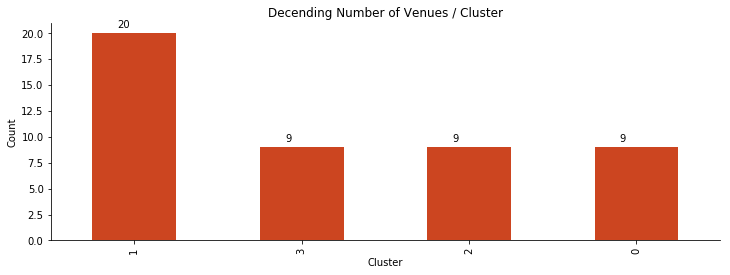

In [415]:
# get count for each cluster
clusterCounts = htxCrawlVenues['DbCluster'].value_counts()
plt.figure(figsize=(12,4))
plt.title("Decending Number of Venues / Cluster")
clusterCounts.plot(kind='bar', color='#cc4520')
plt.ylabel('Count')
plt.xlabel('Cluster')
plt.gca().spines['right'].set_color('none')
plt.gca().spines['top'].set_color('none')

for i, v in enumerate(clusterCounts.tolist()):
    plt.text(htxCrawlVenues['DbCluster'].unique().tolist()[i] - 0.1, v + 0.5, str(v))

plt.show()

In [314]:
# sort for later recommendations
clusterCounts = clusterCounts.sort_index().tolist()
clusterCounts

[9, 20, 9, 9]

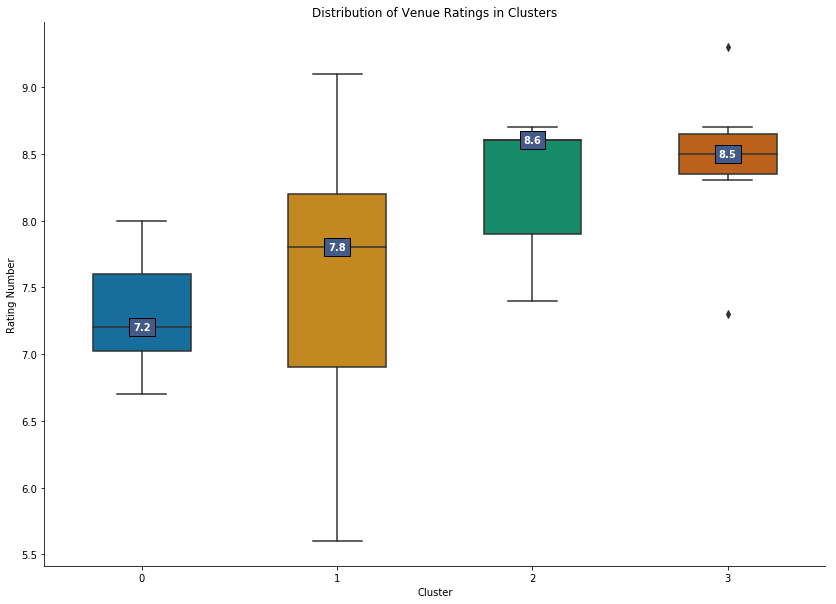

In [315]:
plt.figure(figsize=(14,10))
plt.title("Distribution of Venue Ratings in Clusters")

ratingsBox = sns.boxplot(y='VenueRating', x='DbCluster', 
             data=htxCrawlVenues, 
             width=0.5,
             palette="colorblind")

plt.xlabel('Cluster')
plt.ylabel('Rating Number')


ax = ratingsBox.axes
lines = ax.get_lines()
categories = ax.get_xticks()

clusterRatings = []
for cat in categories:
    # every 4th line at the interval of 6 is median  line
    y = round(lines[4+cat*6].get_ydata()[0],1) 
    ax.text(
        cat, 
        y, 
        f'{y}', 
        ha='center', 
        va='center', 
        fontweight='bold', 
        size=10,
        color='white',
        bbox=dict(facecolor='#445A88'))
    
    clusterRatings.append(y)

plt.gca().spines['right'].set_color('none')
plt.gca().spines['top'].set_color('none')
plt.show()

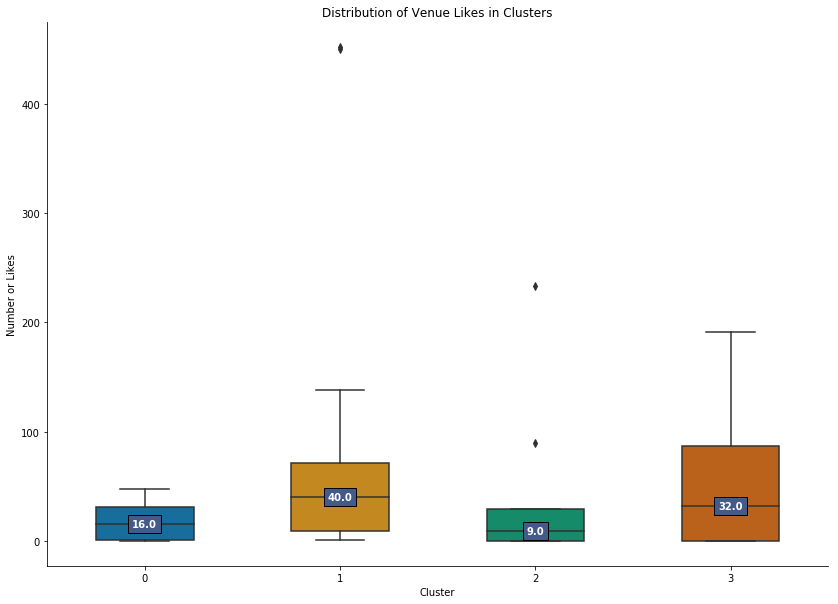

In [316]:
plt.figure(figsize=(14,10))
plt.title("Distribution of Venue Likes in Clusters")

ratingsBox = sns.boxplot(y='VenueLikes', x='DbCluster', 
             data=htxCrawlVenues, 
             width=0.5,
             palette="colorblind")

plt.xlabel('Cluster')
plt.ylabel('Number or Likes')


ax = ratingsBox.axes
lines = ax.get_lines()
categories = ax.get_xticks()

clusterLikes = []
for cat in categories:
    # every 4th line at the interval of 6 is median  line
    y = round(lines[4+cat*6].get_ydata()[0],1) 
    ax.text(
        cat, 
        y, 
        f'{y}', 
        ha='center', 
        va='center', 
        fontweight='bold', 
        size=10,
        color='white',
        bbox=dict(facecolor='#445A88'))
    
    clusterLikes.append(y)

plt.gca().spines['right'].set_color('none')
plt.gca().spines['top'].set_color('none')
plt.show()

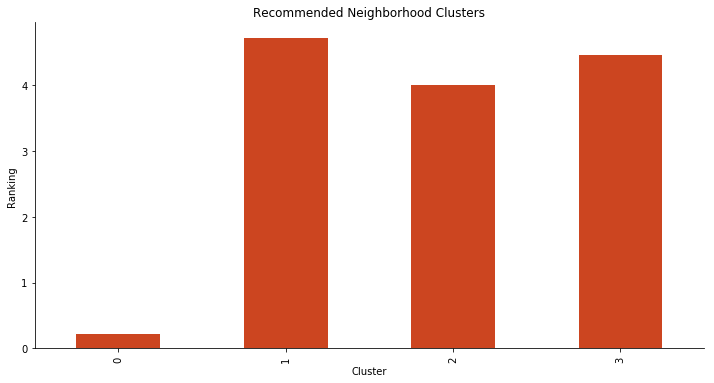

In [320]:
# recommend districts based on ratings, likes, and options
# To weigh the values we'll normalize the counts and medians, then multiply by the weights, and last sum the scores
normalCounts = preprocessing.minmax_scale(clusterCounts)
normalRatings = preprocessing.minmax_scale(clusterRatings)
normalLikes = preprocessing.minmax_scale(clusterLikes)

clusterRanking = []
i = 0
for count in normalCounts:
    clusterRanking.append(count*priorityWeight['Count'] + normalRatings[i]*priorityWeight['Rating'] + normalLikes[i]*priorityWeight['Likes'])
    i = i + 1

plt.figure(figsize=(12,6))
plt.title("Recommended Neighborhood Clusters")
pd.Series(clusterRanking).plot(kind='bar', color='#cc4520')
plt.ylabel('Ranking')
plt.xlabel('Cluster')
plt.gca().spines['right'].set_color('none')
plt.gca().spines['top'].set_color('none')

plt.show()

In [321]:
clusterRanking

[0.22580645161290325, 4.714285714285712, 4.0, 4.456221198156683]

In [331]:
# lets cleanup the dataframe
topCluster =  htxCrawlVenues[htxCrawlVenues['DbCluster'] == clusterRanking.index(max(clusterRanking))]
# don't need these any longer
topCluster = topCluster.drop(columns=[ 'NeighborhoodLatitude', 'NeighborhoodLongitude', 'DbCluster'])
topCluster

,Neighborhood,name,categories,id,lat,lng,VenueRating,VenueLikes,VenuePrice
14,DOWNTOWN,Biggio's,Sports Bar,5814b48d38fa91a230b3085d,29.754688,-95.358142,8.2,60.0,1.0
15,DOWNTOWN,Biggio's,Sports Bar,5814b48d38fa91a230b3085d,29.754688,-95.358142,6.9,51.0,2.0
16,DOWNTOWN,Grotto Downtown,Italian Restaurant,5815e4be38fab8bf7b564739,29.753918,-95.357197,8.2,37.0,2.0
17,DOWNTOWN,Grotto Downtown,Italian Restaurant,5815e4be38fab8bf7b564739,29.753918,-95.357197,7.1,6.0,2.0
20,DOWNTOWN,MKT BAR,Gastropub,4eb34b14722e578a4e83e10a,29.754746,-95.361495,7.8,138.0,2.0
21,DOWNTOWN,MKT BAR,Gastropub,4eb34b14722e578a4e83e10a,29.754746,-95.361495,6.5,24.0,2.0
24,DOWNTOWN,Saint Arnold Bar,Bar,51bd0c83498ea91cb2025315,29.757030,-95.356091,8.0,23.0,2.0
27,DOWNTOWN,Lobby Lounge at Four Seasons Hotel Houston,Lounge,4dd684ac922ef477d2a275d9,29.754207,-95.362706,NaN,5.0,1.0
29,DOWNTOWN,Hilton Americas Executive Lounge,Lounge,52ab9bdb11d2fb444a0d1cd2,29.752043,-95.360783,5.8,10.0,2.0
30,DOWNTOWN,Reserve 101,Whisky Bar,4b5fc53bf964a52028cc29e3,29.753766,-95.363370,8.3,78.0,2.0


In [343]:
# fill in NaN with median values for ratings
print('NaN counts to replace with median: ', topCluster['VenueRating'].isna().sum())
theRatings =  topCluster.dropna(subset=['VenueRating'])
ratingMedian = np.median(theRatings['VenueRating'].tolist())

# top venues based on priorities
topVenues = topCluster
topVenues[['VenueRating']] = topVenues[['VenueRating']].fillna(value=ratingMedian)
topVenues = topVenues.sort_values(['VenueRating', 'VenueLikes'], ascending=[False, False]).reset_index(drop=True)
#topVenues = topVenues.drop(columns=['VenueId'])
topVenues = topVenues[['name', 'Neighborhood', 'lat', 'lng', 'VenueRating', 'VenueLikes', 'VenuePrice', 'categories']]
topVenues.head(10)

NaN counts to replace with median:  0


,name,Neighborhood,lat,lng,VenueRating,VenueLikes,VenuePrice,categories
0,Magnolia Hotel 2nd Floor Caroline Room,DOWNTOWN,29.759094,-95.361575,9.1,450.0,2.0,Hotel Bar
1,Hearsay on the Green,DOWNTOWN,29.752683,-95.361123,8.8,452.0,2.0,New American Restaurant
2,Reserve 101,DOWNTOWN,29.753766,-95.363370,8.3,78.0,2.0,Whisky Bar
3,Biggio's,DOWNTOWN,29.754688,-95.358142,8.2,60.0,1.0,Sports Bar
4,Grotto Downtown,DOWNTOWN,29.753918,-95.357197,8.2,37.0,2.0,Italian Restaurant
5,Lobby Bar,DOWNTOWN,29.752080,-95.360224,8.1,26.0,2.0,Hotel Bar
6,HTX Fan Tavern,DOWNTOWN,29.755436,-95.355356,8.0,43.0,2.0,Sports Bar
7,Saint Arnold Bar,DOWNTOWN,29.757030,-95.356091,8.0,23.0,2.0,Bar
8,MKT BAR,DOWNTOWN,29.754746,-95.361495,7.8,138.0,2.0,Gastropub
9,Lobby Lounge at Four Seasons Hotel Houston,DOWNTOWN,29.754207,-95.362706,7.8,5.0,1.0,Lounge


In [360]:
# Take a sample of seven and see if we can group them
venueSet = topVenues
crawlFit = False
maxIndex = 7

# this could be clearner and more effiecient but this should be a short quick run
while not crawlFit:
    # DBSCAN to veryfy it's walkable
    coords = venueSet.iloc[0:maxIndex, 2:4].to_numpy()
    cvDb = DBSCAN(eps=epsilon, min_samples=min_locations, algorithm='ball_tree', metric='haversine').fit(np.radians(coords))
    clusterLabels = cvDb.labels_
    numClusters = len(set(clusterLabels))
    clusters = pd.Series([coords[clusterLabels == n] for n in range(numClusters)])
    set(clusterLabels)
    tempSet = venueSet.iloc[0:maxIndex, 0:8]
    tempSet['DbCluster'] = clusterLabels
    tempSet = tempSet[tempSet.DbCluster == 0].reset_index(drop=True)
    
    primeCount = tempSet['categories'].value_counts() 
    if tempSet.shape[0] >= min_locations:
        crawlFit = True
    else:
        maxIndex = maxIndex + 1
    

# combine the cluster data with cincyVenues
venueSet = tempSet
venueSet

,name,Neighborhood,lat,lng,VenueRating,VenueLikes,VenuePrice,categories,DbCluster
0,Hearsay on the Green,DOWNTOWN,29.752683,-95.361123,8.8,452.0,2.0,New American Restaurant,0
1,Reserve 101,DOWNTOWN,29.753766,-95.363370,8.3,78.0,2.0,Whisky Bar,0
2,Biggio's,DOWNTOWN,29.754688,-95.358142,8.2,60.0,1.0,Sports Bar,0
3,Grotto Downtown,DOWNTOWN,29.753918,-95.357197,8.2,37.0,2.0,Italian Restaurant,0
4,Lobby Bar,DOWNTOWN,29.752080,-95.360224,8.1,26.0,2.0,Hotel Bar,0
5,HTX Fan Tavern,DOWNTOWN,29.755436,-95.355356,8.0,43.0,2.0,Sports Bar,0


In [361]:
latLong = venueSet[['lng', 'lat']].values.tolist()
crawlMap = mapBuilder(centeroidCord(latLong, False), 16)

# add approximate buisness center markers to map
for lat, lng, venue in zip(venueSet['lat'], venueSet['lng'], venueSet['name']):
    label = '{}'.format(venue)
    label = folium.Popup(label, parse_html=True,  max_width=224)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='black',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(crawlMap)

folium.PolyLine(venueSet[['lat', 'lng']].values.tolist(), color="green", weight=3.5, opacity=1).add_to(crawlMap)

# display map
crawlMap

In [362]:
# Manually adjusting route to optimize
venueSet['Stop Order'] = [1,0,3,4,2,5]
venueSet = venueSet.sort_values(by=['Stop Order']).reset_index(drop=True)

In [363]:
latLong = venueSet[['lng', 'lat']].values.tolist()
crawlMap = mapBuilder(centeroidCord(latLong, False), 16)

# add approximate buisness center markers to map
for lat, lng, venue in zip(venueSet['lat'], venueSet['lng'], venueSet['name']):
    label = '{}'.format(venue)
    label = folium.Popup(label, parse_html=True,  max_width=224)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='black',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(crawlMap)

folium.PolyLine(venueSet[['lat', 'lng']].values.tolist(), color="green", weight=3.5, opacity=1).add_to(crawlMap)

# display map
crawlMap